In [33]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2
%qtconsole
%config InlineBackend.figure_format = 'retina'

In [2]:
import pandas as pd
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import logging
logging.basicConfig(level=logging.INFO)

In [3]:
from src.parameters import ANIMALS, SAMPLING_FREQUENCY
from loren_frank_data_processing.position import (
    get_interpolated_position_dataframe, get_position_dataframe,
    get_linear_position_structure)

In [4]:
from itertools import product

import numpy as np

import networkx as nx

from loren_frank_data_processing.core import get_data_structure


def get_track_segments(epoch_key, animals):
    '''

    Parameters
    ----------
    epoch_key : tuple
    animals : dict of namedtuples

    Returns
    -------
    track_segments : ndarray, shape (n_segments, n_nodes, n_space)
    center_well_position : ndarray, shape (n_space,)

    '''
    animal, day, epoch = epoch_key
    task_file = get_data_structure(animals[animal], day, 'task', 'task')
    linearcoord = task_file[epoch - 1]['linearcoord'][0, 0].squeeze()
    track_segments = [np.stack(((arm[:-1, :, 0], arm[1:, :, 0])), axis=1)
                      for arm in linearcoord]
    center_well_position = track_segments[0][0][0]
    return (np.unique(np.concatenate(track_segments), axis=0),
            center_well_position)


def make_track_graph(epoch_key, animals):
    '''

    Parameters
    ----------
    epoch_key : tuple, (animal, day, epoch)
    animals : dict of namedtuples

    Returns
    -------
    track_graph : networkx Graph
    center_well_id : int

    '''
    track_segments, center_well_position = get_track_segments(
        epoch_key, animals)
    nodes = np.unique(track_segments.reshape((-1, 2)), axis=0)

    edges = np.zeros(track_segments.shape[:2], dtype=int)
    for node_id, node in enumerate(nodes):
        edge_ind = np.nonzero(np.isin(track_segments, node).sum(axis=2) > 1)
        edges[edge_ind] = node_id

    edge_distances = np.linalg.norm(
        np.diff(track_segments, axis=-2).squeeze(), axis=1)

    track_graph = nx.Graph()

    for node_id, node_position in enumerate(nodes):
        track_graph.add_node(node_id, pos=tuple(node_position))

    for edge, distance in zip(edges, edge_distances):
        track_graph.add_edge(edge[0], edge[1], distance=distance)

    center_well_id = np.unique(
        np.nonzero(np.isin(nodes, center_well_position).sum(axis=1) > 1)[0])[0]

    return track_graph, center_well_id


def get_track_segments_from_graph(track_graph):
    '''

    Parameters
    ----------
    track_graph : networkx Graph

    Returns
    -------
    track_segments : ndarray, shape (n_segments, n_nodes, n_space)

    '''
    node_position = nx.get_node_attributes(track_graph, 'pos')
    return np.asarray([(node_position[node1], node_position[node2])
                       for node1, node2 in track_graph.edges()])


def plot_track(track_graph, ax=None):
    '''

    Parameters
    ----------
    track_graph : networkx Graph

    '''
    node_position = nx.get_node_attributes(track_graph, 'pos')
    nx.draw_networkx(track_graph, node_position, ax)


def project_points_to_segment(track_segments, position):
    '''Finds the closet point on a track segment in terms of Euclidean distance

    Parameters
    ----------
    track_segments : ndarray, shape (n_segments, n_nodes, n_space)
    position : ndarray, shape (n_time, n_space)

    Returns
    -------
    projected_positions : ndarray, shape (n_time, n_segments, n_space)

    '''
    segment_diff = np.diff(track_segments, axis=1).squeeze()
    sum_squares = np.sum(segment_diff ** 2, axis=1)
    node1 = track_segments[:, 0, :]
    nx = (np.sum(segment_diff *
                 (position[:, np.newaxis, :] - node1), axis=2) /
          sum_squares)
    nx[np.where(nx < 0)] = 0.0
    nx[np.where(nx > 1)] = 1.0
    return node1[np.newaxis, ...] + (
        nx[:, :, np.newaxis] * segment_diff[np.newaxis, ...])


def find_projected_point_distance(track_segments, position):
    '''
    '''
    return np.linalg.norm(
        position[:, np.newaxis, :] -
        project_points_to_segment(track_segments, position), axis=2)


def find_nearest_segment(track_segments, position):
    '''Returns the track segment that is closest to the position
    at each time point.

    Parameters
    ----------
    track_segments : ndarray, shape (n_segments, n_nodes, n_space)
    position : ndarray, shape (n_time, n_space)

    Returns
    -------
    segment_id : ndarray, shape (n_time,)

    '''
    distance = find_projected_point_distance(track_segments, position)
    return np.argmin(distance, axis=1)


def euclidean_distance(position):
    '''Distance between position at successive time points

    Parameters
    ----------
    position : ndarray, shape (n_time, n_space)

    Returns
    -------
    distance : ndarray, shape (n_time,)

    '''
    distance = np.linalg.norm(position[1:] - position[:-1], axis=1)
    return np.concatenate(([np.nan], distance))


def route_distance(candidates_t_1, candidates_t, track_graph):
    '''

    Parameters
    ----------
    candidates_t_1 : ndarray, shape (n_segments, n_space)
    candidates_t : ndarray, shape (n_segments, n_space)
    track_graph : networkx Graph

    Returns
    -------
    route_distance : ndarray, shape (n_segments, n_segments)

    '''
    n_segments = len(track_graph.edges)
    if np.any(np.isnan(candidates_t) | np.isnan(candidates_t)):
        return np.full((n_segments, n_segments), np.nan)
    track_graph1 = track_graph.copy()

    # insert virtual node
    for candidate_id, (position_t, position_t_1, edge_id) in enumerate(
            zip(candidates_t, candidates_t_1, track_graph.edges)):
        node_name_t = 't_{0}'.format(candidate_id)
        node_name_t_1 = 't_1_{0}'.format(candidate_id)
        node1, node2 = edge_id
        outside_nodes = np.array([node1, node2], dtype=object)
        inside_nodes = np.array([node_name_t, node_name_t_1], dtype=object)
        outside_pos = np.array(
            [track_graph1.nodes[node1]['pos'],
             track_graph1.nodes[node2]['pos']], dtype=object)
        inside_pos = np.array([position_t, position_t_1])
        sorted_outside = np.argsort(outside_pos, axis=0)[:, 0]
        sorted_inside = np.argsort(inside_pos, axis=0)[:, 0]
        nodes = np.empty((4,), dtype=object)
        nodes[[1, 2]] = inside_nodes[sorted_inside]
        nodes[[0, 3]] = outside_nodes[sorted_outside]
        track_graph1.add_path(nodes)
        track_graph1.remove_edge(node1, node2)
        track_graph1.nodes[node_name_t]['pos'] = tuple(position_t)
        track_graph1.nodes[node_name_t_1]['pos'] = tuple(position_t_1)

    # calculate distance
    for e in track_graph1.edges(data=True):
        track_graph1.edges[e[:2]]['distance'] = np.linalg.norm(
            track_graph1.node[e[0]]['pos'] -
            np.array(track_graph1.node[e[1]]['pos']))

    # calculate path distance
    node_names_t = ['t_{0}'.format(i) for i in range(n_segments)]
    node_names_t_1 = ['t_1_{0}'.format(i) for i in range(n_segments)]
    path_distance = [
        nx.shortest_path_length(track_graph1, source=node_t, target=node_t_1,
                                weight='distance')
        for node_t, node_t_1 in product(node_names_t, node_names_t_1)]
    return np.array(path_distance).reshape((n_segments, n_segments))


def route_distances(position, track_graph):
    track_segments = get_track_segments_from_graph(track_graph)
    projected_track_position = project_points_to_segment(
        track_segments, position)
    distances = np.stack(
        [route_distance(p_t, p_t_1, track_graph)
         for p_t, p_t_1 in zip(projected_track_position[1:],
                               projected_track_position[:-1])])
    return np.concatenate(
        (np.full((1, *distances.shape[1:]), np.nan), distances))


def calculate_position_likelihood(position, track_graph, sigma=10):
    track_segments = get_track_segments_from_graph(track_graph)
    projected_position_distance = find_projected_point_distance(
        track_segments, position)
    return (np.exp(-0.5 * (projected_position_distance / sigma) ** 2) /
            (np.sqrt(2 * np.pi) * sigma))


def normalize_to_probability(x, axis=-1):
    '''Ensure the array axis sum to 1

    Parameters
    ----------
    x : ndarray

    Returns
    -------
    normalized_x : ndarray

    '''
    return x / x.sum(axis=axis, keepdims=True)


def calculate_empirical_state_transition(position, track_graph,
                                         scaling=1E-1):
    '''Calculates the state transition probabilty between track segments by
    favoring route distances that are similar to euclidean distances between
    successive time points.

    Parameters
    ----------
    position : ndarray, shape (n_time, n_space)
    track_graph : networkx Graph
    scaling : float, optional

    Returns
    -------
    state_transition_matrix : shape (n_time, n_segments, n_segments)

    References
    ----------
    .. [1] Newson, P., and Krumm, J. (2009). Hidden Markov map matching through
    noise and sparseness. In Proceedings of the 17th ACM SIGSPATIAL
    International Conference on Advances in Geographic Information Systems,
    (ACM), pp. 336-343.

    '''
    route_and_euclidean_distance_similarity = np.abs(
        route_distances(position, track_graph) -
        euclidean_distance(position)[:, np.newaxis, np.newaxis])
    exponential_pdf = (
        np.exp(-route_and_euclidean_distance_similarity / scaling) / scaling)
    return normalize_to_probability(exponential_pdf, axis=2)


def viterbi(initial_conditions, state_transition, likelihood):
    '''Find the most likely sequence of paths using the Viterbi algorithm.

    Note that the state_transition matrix is time-dependent. NaNs are removed
    and placed back in at the end.

    Parameters
    ----------
    initial_conditions : ndarray, shape (n_states,)
    state_transition : ndarray, shape (n_time, n_states, n_states)
    likelihood : ndarray, shape (n_time, n_states)

    Returns
    -------
    state_id : ndarray, shape (n_time,)

    '''
    is_nan = np.any(np.isnan(likelihood), axis=1)
    likelihood = likelihood.copy()[~is_nan]
    state_transition = state_transition.copy()[~is_nan]

    n_time, n_states = likelihood.shape
    posterior = np.zeros((n_time, n_states))
    max_state_ind = np.zeros((n_time, n_states), dtype=np.int)

    # initialization
    posterior[0] = np.log(initial_conditions) + np.log(likelihood[0])

    # recursion
    for time_ind in range(1, n_time):
        prior = posterior[time_ind - 1] + np.log(state_transition[time_ind])
        max_state_ind[time_ind] = prior.argmax(axis=1)
        posterior[time_ind] = prior[np.arange(
            n_states), max_state_ind[time_ind]] + np.log(likelihood[time_ind])

    # termination
    most_probable_state_ind = np.zeros((n_time,), dtype=np.int)
    most_probable_state_ind[n_time - 1] = np.argmax(posterior[n_time - 1])

    # path back-tracking
    for time_ind in reversed(range(n_time - 1)):
        most_probable_state_ind[time_ind] = max_state_ind[
            time_ind + 1, most_probable_state_ind[time_ind + 1]]

    most_probable_state_ind_with_nan = np.full((is_nan.size,), np.nan)
    most_probable_state_ind_with_nan[~is_nan] = most_probable_state_ind
    return most_probable_state_ind_with_nan


def classify_track_segments(track_graph, position, sensor_std_dev=10,
                            route_euclidean_distance_scaling=1E-1):
    '''Find the most likely track segment for a given position.

    Tries to make sure the euclidean distance between successive time points
    is similar to the route distance along the graph.

    Parameters
    ----------
    track_graph : networkx Graph
    position : ndarray, shape (n_time, n_space)
    sensor_std_dev : float, optional
        Uncertainty of position sensor.
    route_euclidean_distance_scaling : float, optional
        How much to prefer route distances between successive time points
        that are closer to the euclidean distance. Smaller numbers mean the
        route distance is more likely to be close to the euclidean distance.

    Returns
    -------
    segment_id : ndarray, shape (n_time,)

    References
    ----------
    .. [1] Newson, P., and Krumm, J. (2009). Hidden Markov map matching through
    noise and sparseness. In Proceedings of the 17th ACM SIGSPATIAL
    International Conference on Advances in Geographic Information Systems,
    (ACM), pp. 336-343.

    '''
    n_segments = len(track_graph.edges)
    initial_conditions = np.ones((n_segments,))
    state_transition = calculate_empirical_state_transition(
        position, track_graph, scaling=route_euclidean_distance_scaling)
    likelihood = calculate_position_likelihood(
        position, track_graph, sigma=sensor_std_dev)

    return viterbi(initial_conditions, state_transition, likelihood)


def calculate_linear_distance(track_graph, track_segment_id, well_id,
                              position):
    '''Finds the path distance along a graph relative to a node.

    Parameters
    ----------
    track_graph : networkx Graph
    track_segment_id : ndarray, shape (n_time,)
    well_id : hashable object
    position : ndarray, shape (n_time, n_spaces)

    Returns
    -------
    linear_distance : ndarray, shape (n_time,)
        Linear distance from well specified by `well_id`

    '''
    track_segment_id[np.isnan(track_segment_id)] = 0
    track_segment_id = track_segment_id.astype(int)

    track_segments = get_track_segments_from_graph(track_graph)
    projected_track_positions = project_points_to_segment(
        track_segments, position)
    n_time = projected_track_positions.shape[0]
    projected_track_positions = projected_track_positions[(
        np.arange(n_time), track_segment_id)]
    edge_ids = np.array(track_graph.edges)[track_segment_id]

    linear_distance = []

    for projected_position, edge_id in zip(
            projected_track_positions, edge_ids):
        track_graph1 = track_graph.copy()
        node1, node2 = edge_id
        track_graph1.add_path([node1, 'projected', node2])
        track_graph1.remove_edge(node1, node2)
        track_graph1.nodes['projected']['pos'] = tuple(projected_position)

        # calculate distance
        for edge in track_graph1.edges(data=True):
            track_graph1.edges[edge[:2]]['distance'] = np.linalg.norm(
                track_graph1.node[edge[0]]['pos'] -
                np.array(track_graph1.node[edge[1]]['pos']))

        linear_distance.append(
            nx.shortest_path_length(track_graph1, source='projected',
                                    target=well_id, weight='distance'))

    return np.array(linear_distance)


In [5]:
route_euclidean_distance_scaling = 1

/Users/edeno/miniconda3/envs/Categorize_Replay_2017/lib/python3.6/site-packages/ipykernel/__main__.py:122: RuntimeWarning: invalid value encountered in less
/Users/edeno/miniconda3/envs/Categorize_Replay_2017/lib/python3.6/site-packages/ipykernel/__main__.py:123: RuntimeWarning: invalid value encountered in greater


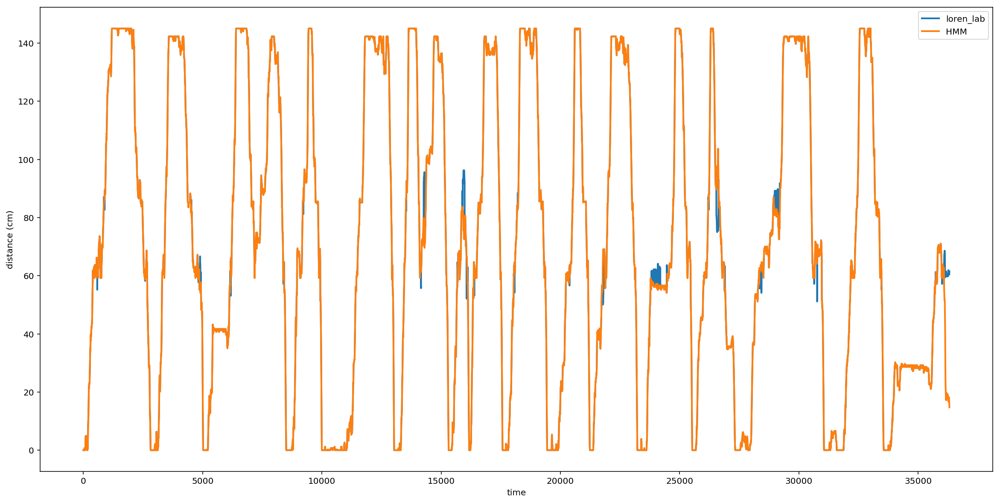

In [6]:
epoch_key = ('HPa', 2, 2)
position_df = get_position_dataframe(epoch_key, ANIMALS)
linear_position_df = get_linear_position_structure(epoch_key, ANIMALS)

track_graph, center_well_id = make_track_graph(epoch_key, ANIMALS)
position = position_df.loc[:, ['x_position', 'y_position']].values
track_segment_id = classify_track_segments(track_graph, position,
                                           route_euclidean_distance_scaling=route_euclidean_distance_scaling)
linear_distance = calculate_linear_distance(track_graph, track_segment_id, center_well_id,
                                            position)

plt.figure(figsize=(20, 10))
plt.plot(linear_position_df.linear_distance.values, linewidth=2, label='loren_lab')
plt.plot(linear_distance, linewidth=2, label='HMM')
plt.xlabel('time')
plt.ylabel('distance (cm)')
plt.legend();

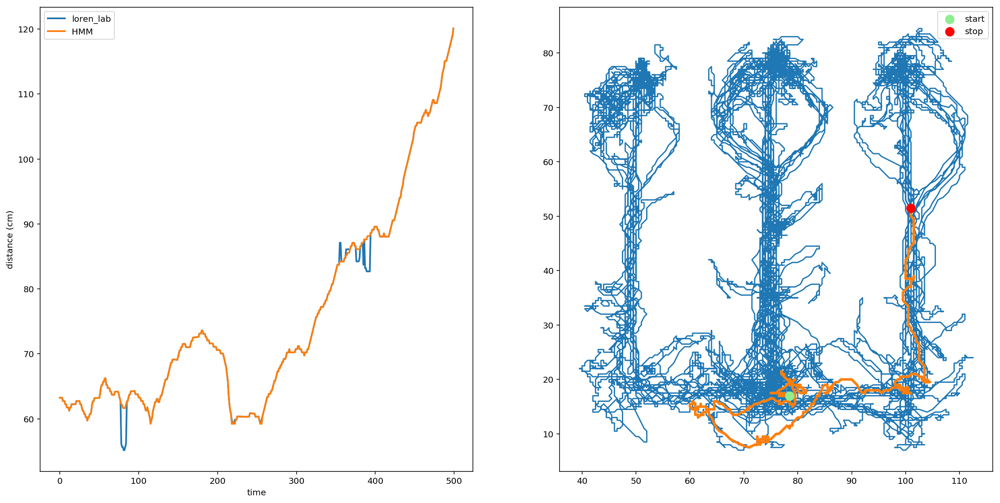

In [7]:
def plot_linear_distance(linear_position_df, linear_distance, position, indices):
    time_ind = slice(*indices)
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    axes[0].plot(linear_position_df.linear_distance.values[time_ind], linewidth=2, label='loren_lab')
    axes[0].plot(linear_distance[time_ind], linewidth=2, label='HMM')
    axes[0].set_xlabel('time')
    axes[0].set_ylabel('distance (cm)')
    axes[0].legend();
    
    axes[1].plot(position[:, 0], position[:, 1])
    axes[1].plot(position[time_ind][:, 0], position[time_ind][:, 1],
                 linewidth=3)
    start_stop = position[time_ind][[0, -1], :]
    axes[1].scatter(start_stop[0, 0], start_stop[0, 1],
                    label='start', color='lightgreen', s=100, zorder=1000)
    axes[1].scatter(start_stop[1, 0], start_stop[1, 1],
                    label='stop', color='red', s=100, zorder=1000)
    axes[1].legend()
    
plot_linear_distance(linear_position_df, linear_distance, position, (500, 1000))

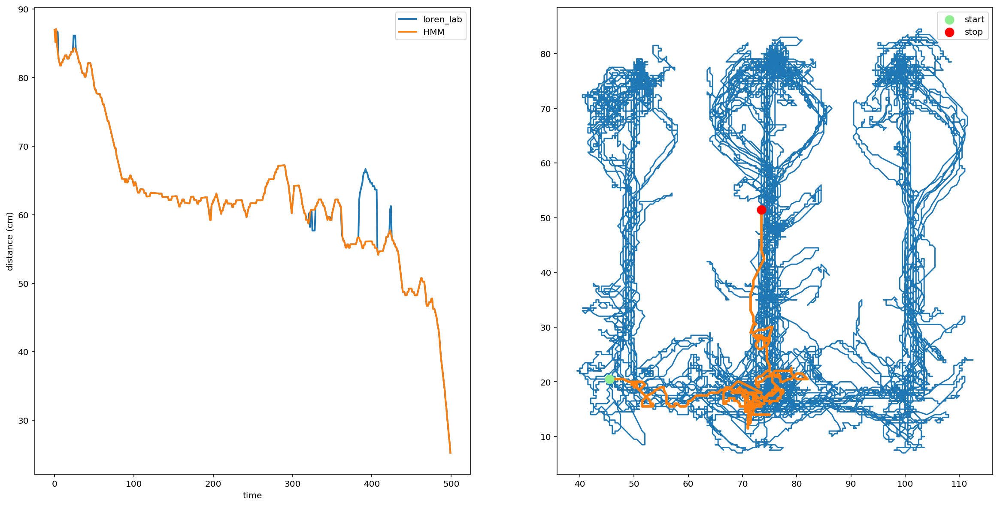

In [8]:
plot_linear_distance(linear_position_df, linear_distance, position, (4500, 5000))

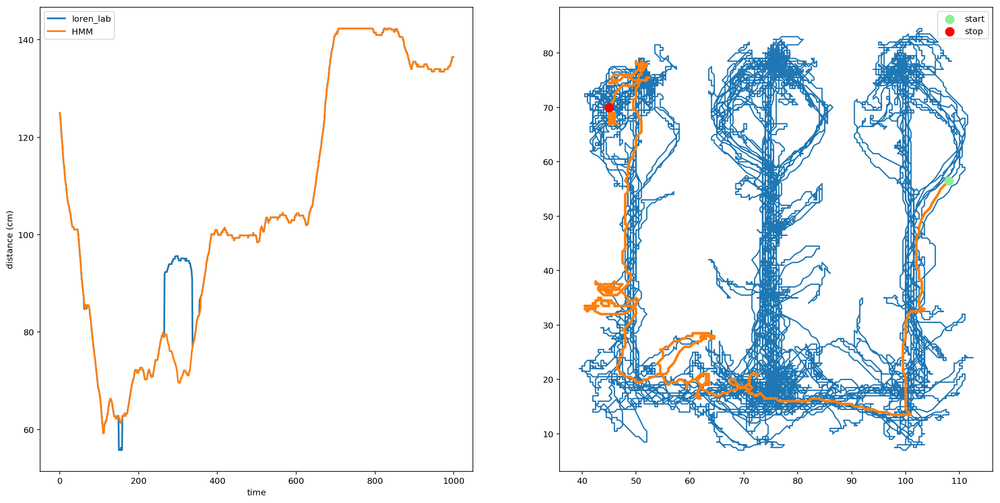

In [9]:
plot_linear_distance(linear_position_df, linear_distance, position, (14000, 15000))

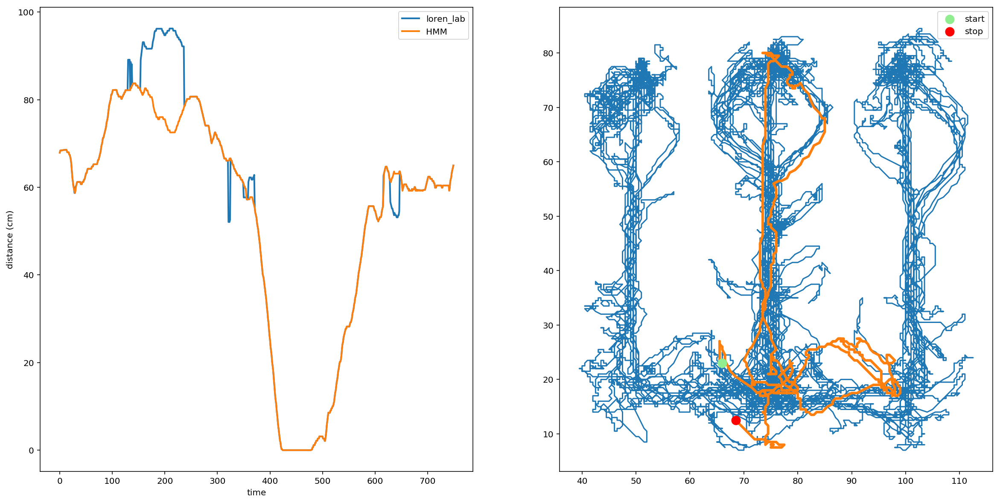

In [10]:
plot_linear_distance(linear_position_df, linear_distance, position, (15750, 16500))

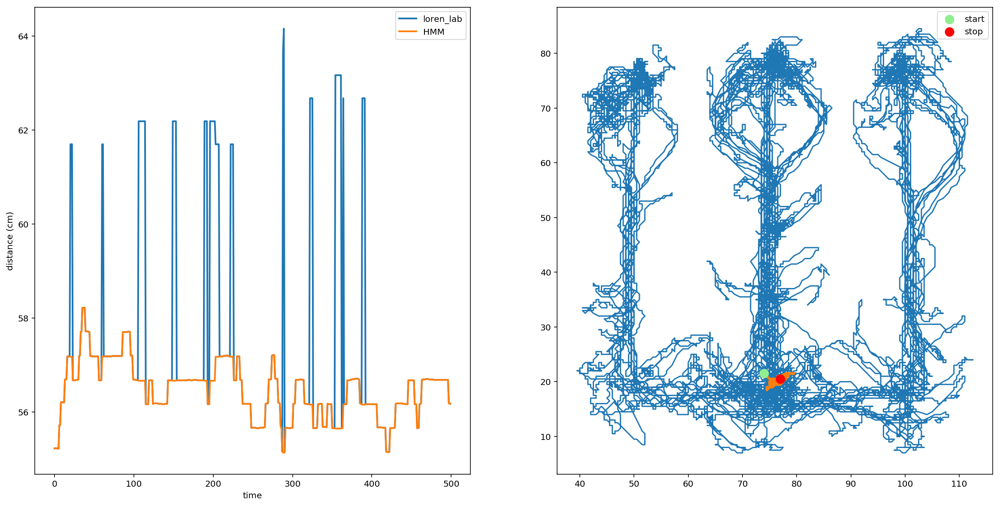

In [11]:
plot_linear_distance(linear_position_df, linear_distance, position, (23800, 24300))

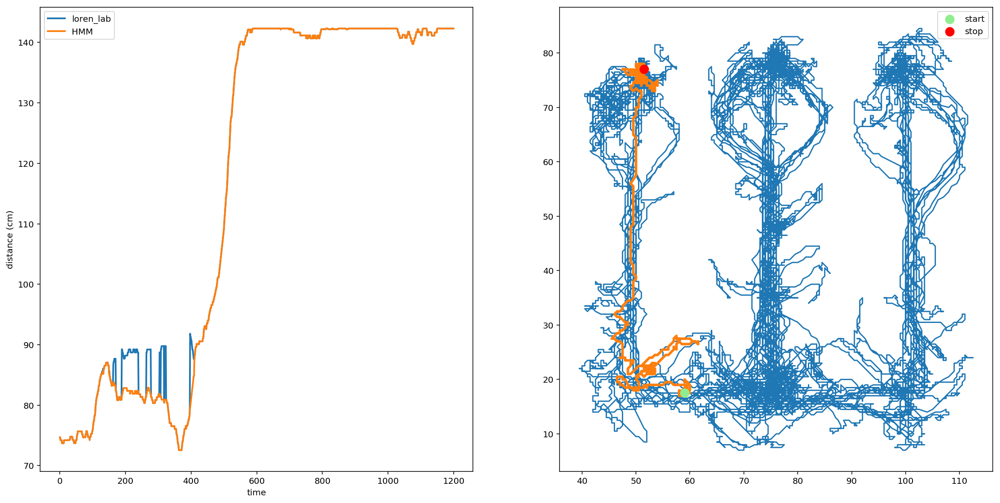

In [12]:
plot_linear_distance(linear_position_df, linear_distance, position, (28800, 30000))

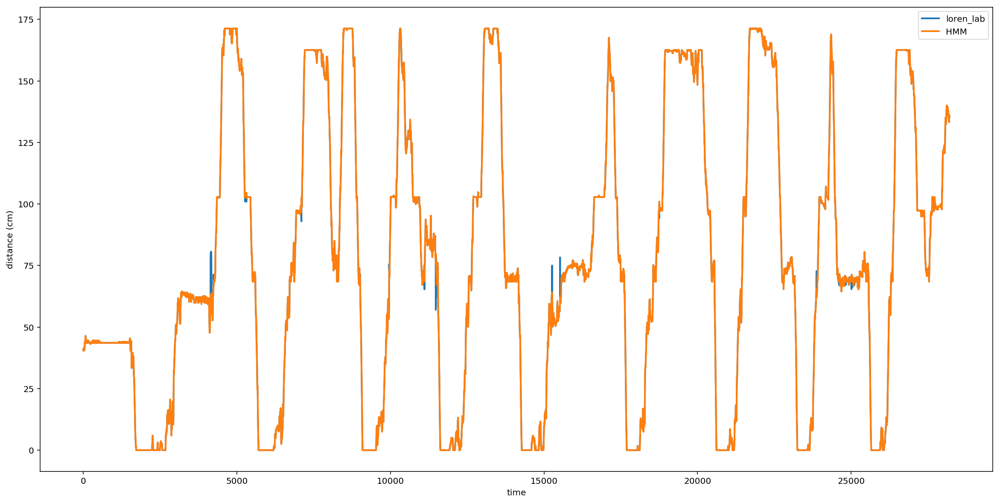

In [13]:
epoch_key = ('bon', 3, 4)
position_df = get_position_dataframe(epoch_key, ANIMALS)
linear_position_df = get_linear_position_structure(epoch_key, ANIMALS)

track_graph, center_well_id = make_track_graph(epoch_key, ANIMALS)
position = position_df.loc[:, ['x_position', 'y_position']].values
track_segment_id = classify_track_segments(track_graph, position,
                                           route_euclidean_distance_scaling=route_euclidean_distance_scaling)
linear_distance = calculate_linear_distance(track_graph, track_segment_id, center_well_id,
                                            position)

plt.figure(figsize=(20, 10))
plt.plot(linear_position_df.linear_distance.values, linewidth=2, label='loren_lab')
plt.plot(linear_distance, linewidth=2, label='HMM')
plt.xlabel('time')
plt.ylabel('distance (cm)')
plt.legend();

/Users/edeno/miniconda3/envs/Categorize_Replay_2017/lib/python3.6/site-packages/ipykernel/__main__.py:122: RuntimeWarning: invalid value encountered in less
/Users/edeno/miniconda3/envs/Categorize_Replay_2017/lib/python3.6/site-packages/ipykernel/__main__.py:123: RuntimeWarning: invalid value encountered in greater


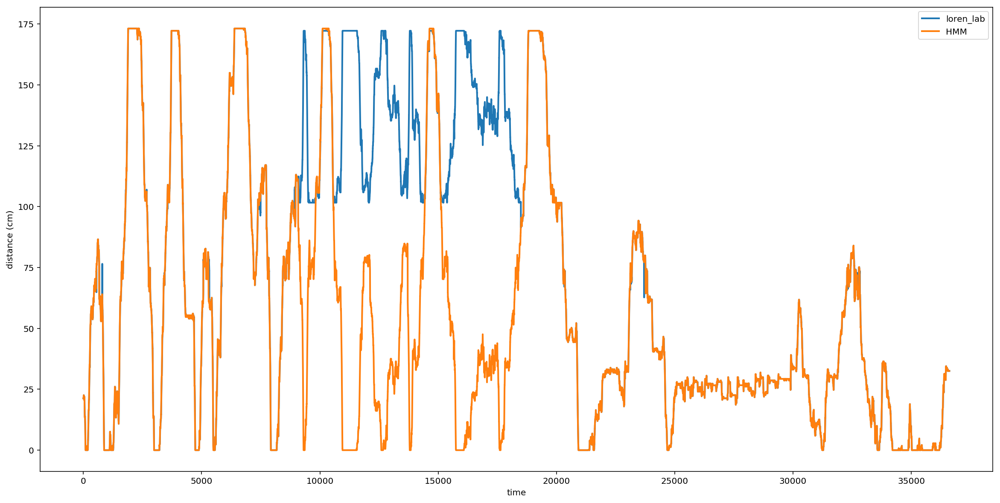

In [14]:
epoch_key = ('HPa', 1, 6)
position_df = get_position_dataframe(epoch_key, ANIMALS)
linear_position_df = get_linear_position_structure(epoch_key, ANIMALS)

track_graph, center_well_id = make_track_graph(epoch_key, ANIMALS)
position = position_df.loc[:, ['x_position', 'y_position']].values
track_segment_id = classify_track_segments(track_graph, position,
                                           route_euclidean_distance_scaling=route_euclidean_distance_scaling)
linear_distance = calculate_linear_distance(track_graph, track_segment_id, center_well_id,
                                            position)

plt.figure(figsize=(20, 10))
plt.plot(linear_position_df.linear_distance.values, linewidth=2, label='loren_lab')
plt.plot(linear_distance, linewidth=2, label='HMM')
plt.xlabel('time')
plt.ylabel('distance (cm)')
plt.legend();

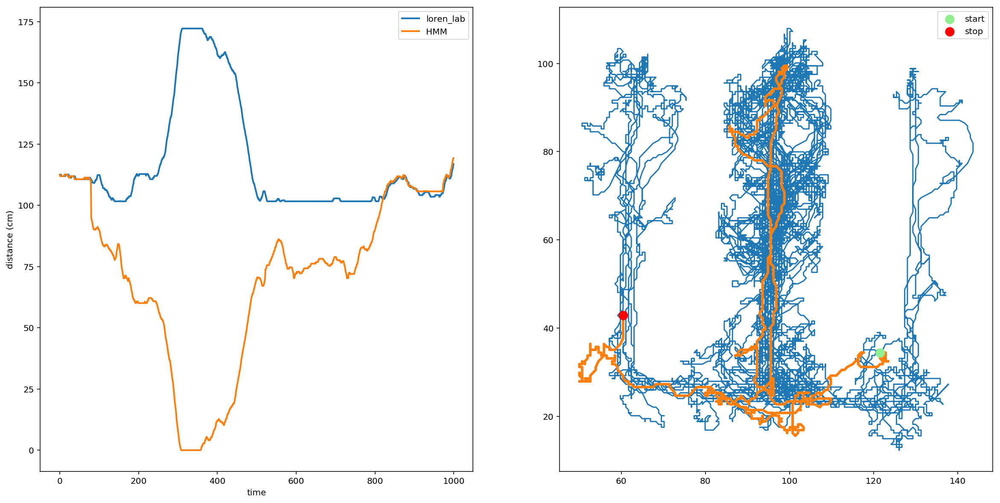

In [15]:
plot_linear_distance(linear_position_df, linear_distance, position, (9000, 10000))

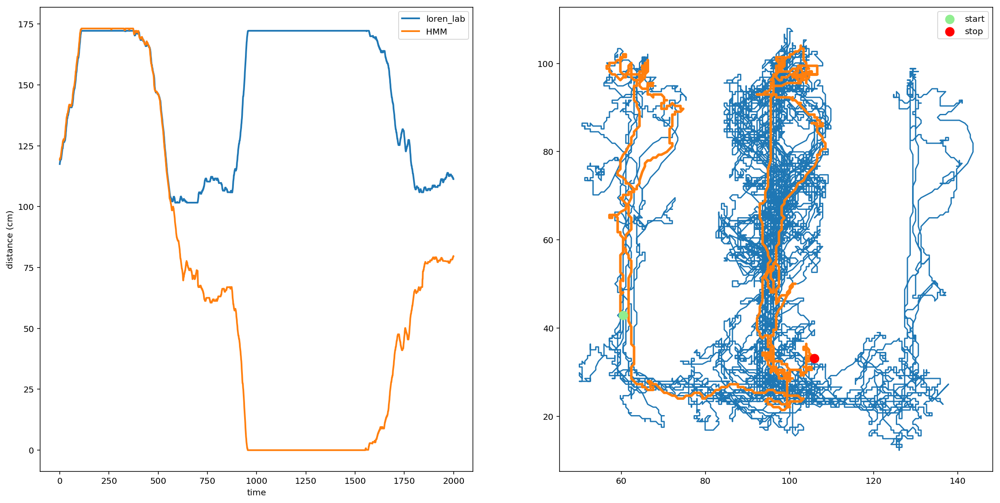

In [16]:
plot_linear_distance(linear_position_df, linear_distance, position, (10000, 12000))

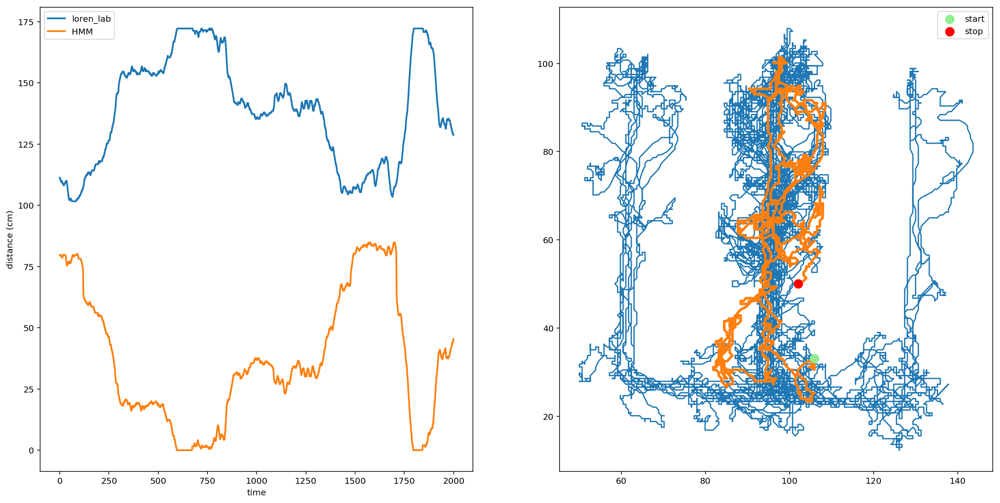

In [17]:
plot_linear_distance(linear_position_df, linear_distance, position, (12000, 14000))

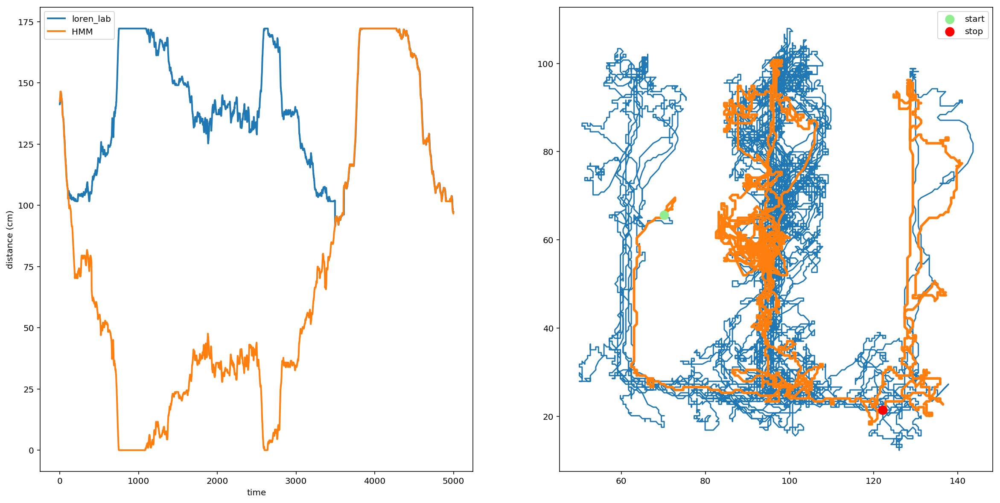

In [18]:
plot_linear_distance(linear_position_df, linear_distance, position, (15000, 20000))

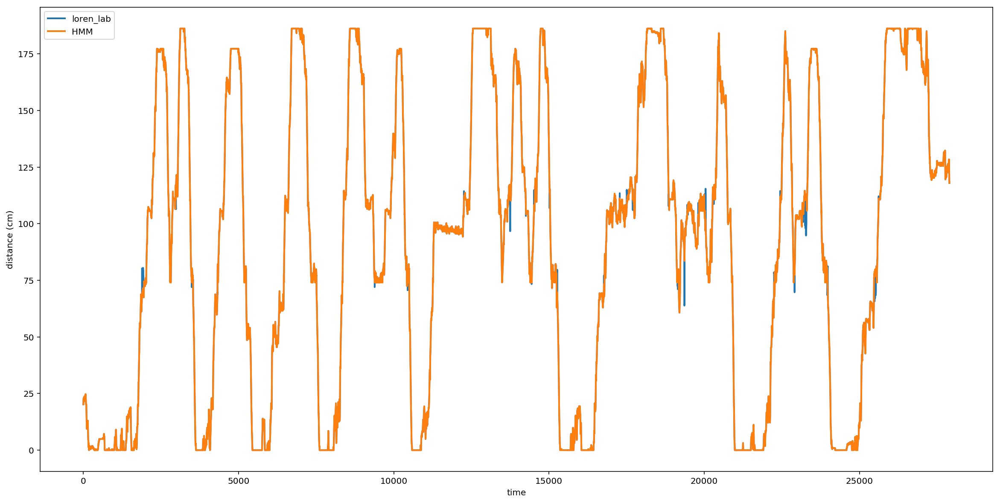

In [26]:
epoch_key = ('bon', 3, 2)
position_df = get_position_dataframe(epoch_key, ANIMALS)
linear_position_df = get_linear_position_structure(epoch_key, ANIMALS)

track_graph, center_well_id = make_track_graph(epoch_key, ANIMALS)
position = position_df.loc[:, ['x_position', 'y_position']].values
track_segment_id = classify_track_segments(track_graph, position,
                                           route_euclidean_distance_scaling=route_euclidean_distance_scaling)
linear_distance = calculate_linear_distance(track_graph, track_segment_id, center_well_id,
                                            position)

plt.figure(figsize=(20, 10))
plt.plot(linear_position_df.linear_distance.values, linewidth=2, label='loren_lab')
plt.plot(linear_distance, linewidth=2, label='HMM')
plt.xlabel('time')
plt.ylabel('distance (cm)')
plt.legend();

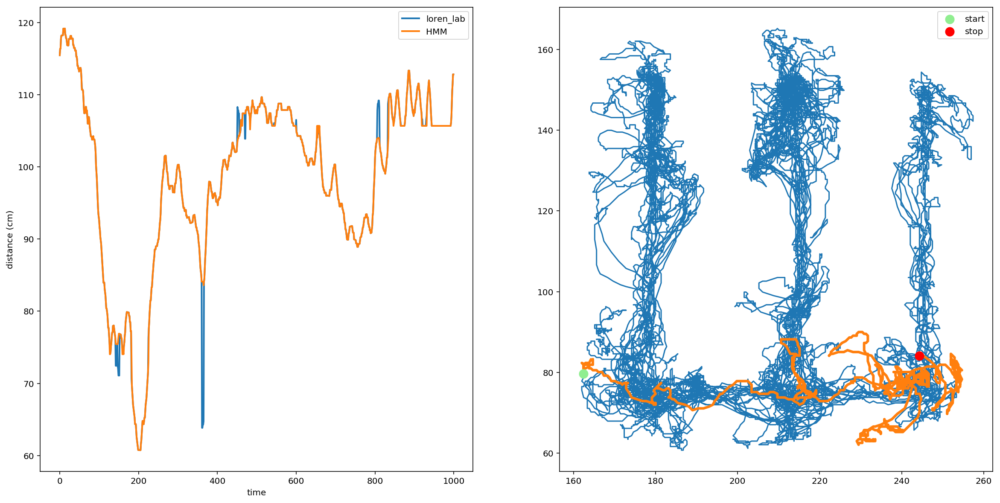

In [20]:
plot_linear_distance(linear_position_df, linear_distance, position, (19000, 20000))

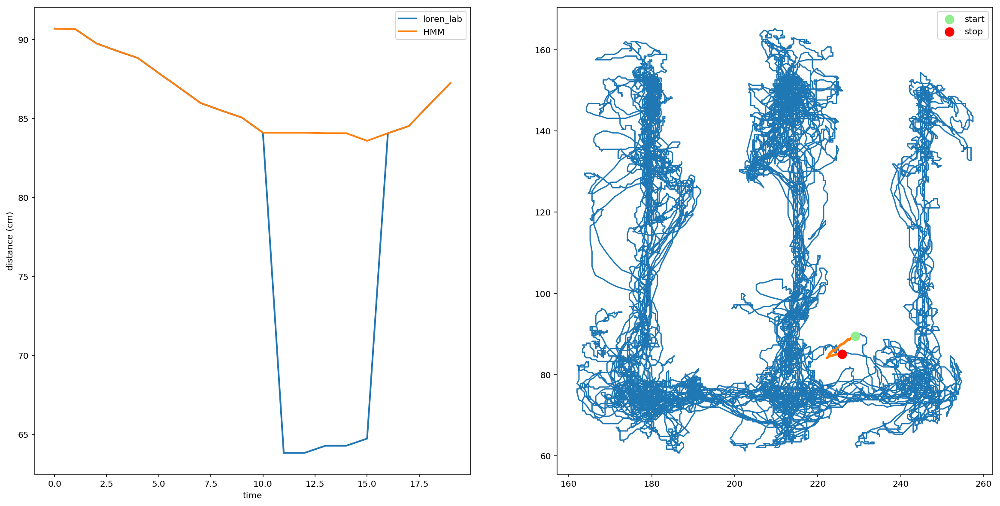

In [31]:
plot_linear_distance(linear_position_df, linear_distance, position, (19350, 19370))

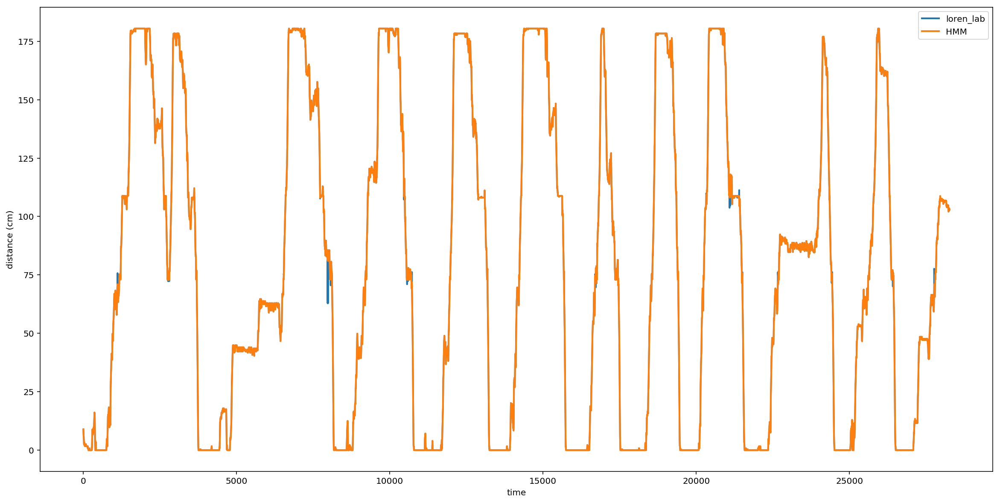

In [21]:
epoch_key = ('bon', 3, 6)
position_df = get_position_dataframe(epoch_key, ANIMALS)
linear_position_df = get_linear_position_structure(epoch_key, ANIMALS)

track_graph, center_well_id = make_track_graph(epoch_key, ANIMALS)
position = position_df.loc[:, ['x_position', 'y_position']].values
track_segment_id = classify_track_segments(track_graph, position,
                                           route_euclidean_distance_scaling=route_euclidean_distance_scaling)
linear_distance = calculate_linear_distance(track_graph, track_segment_id, center_well_id,
                                            position)

plt.figure(figsize=(20, 10))
plt.plot(linear_position_df.linear_distance.values, linewidth=2, label='loren_lab')
plt.plot(linear_distance, linewidth=2, label='HMM')
plt.xlabel('time')
plt.ylabel('distance (cm)')
plt.legend();

/Users/edeno/miniconda3/envs/Categorize_Replay_2017/lib/python3.6/site-packages/ipykernel/__main__.py:122: RuntimeWarning: invalid value encountered in less
/Users/edeno/miniconda3/envs/Categorize_Replay_2017/lib/python3.6/site-packages/ipykernel/__main__.py:123: RuntimeWarning: invalid value encountered in greater


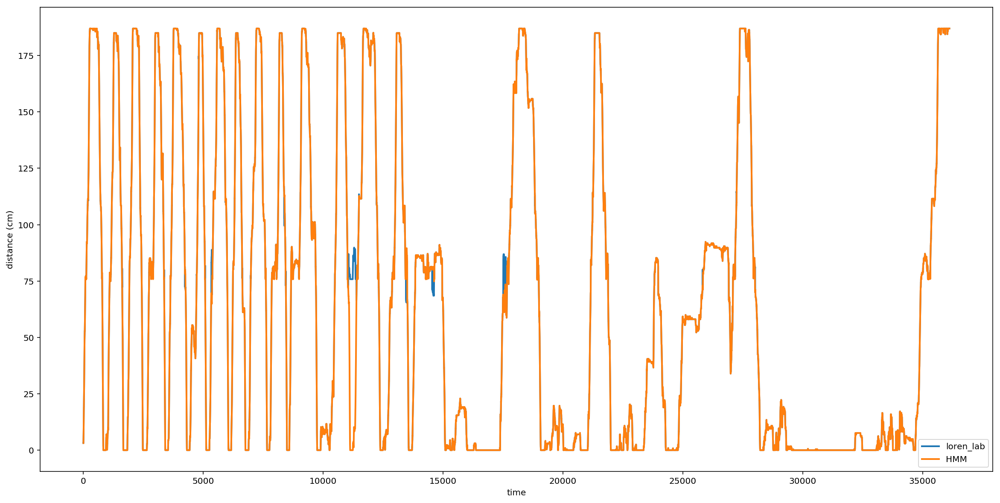

In [22]:
epoch_key = ('HPa', 6, 2)
position_df = get_position_dataframe(epoch_key, ANIMALS)
linear_position_df = get_linear_position_structure(epoch_key, ANIMALS)

track_graph, center_well_id = make_track_graph(epoch_key, ANIMALS)
position = position_df.loc[:, ['x_position', 'y_position']].values
track_segment_id = classify_track_segments(track_graph, position,
                                           route_euclidean_distance_scaling=route_euclidean_distance_scaling)
linear_distance = calculate_linear_distance(track_graph, track_segment_id, center_well_id,
                                            position)

plt.figure(figsize=(20, 10))
plt.plot(linear_position_df.linear_distance.values, linewidth=2, label='loren_lab')
plt.plot(linear_distance, linewidth=2, label='HMM')
plt.xlabel('time')
plt.ylabel('distance (cm)')
plt.legend();

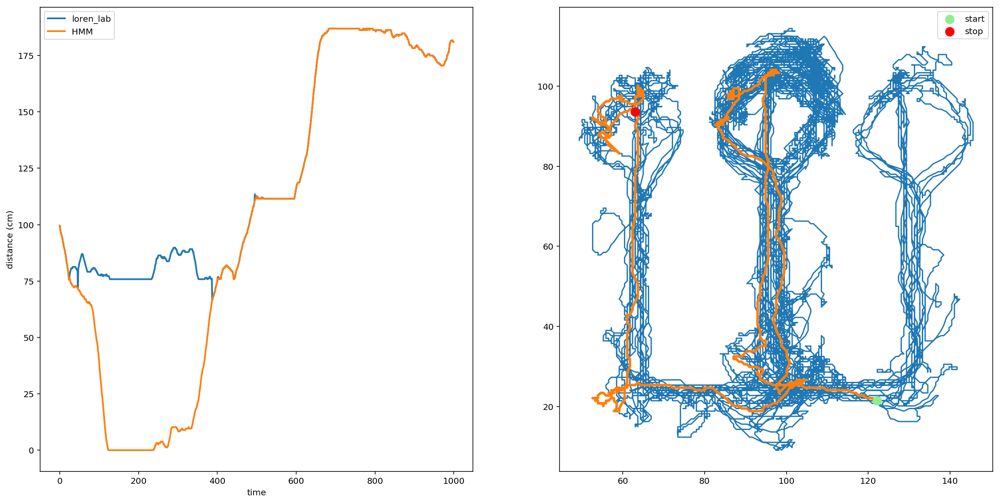

In [23]:
plot_linear_distance(linear_position_df, linear_distance, position, (11000, 12000))

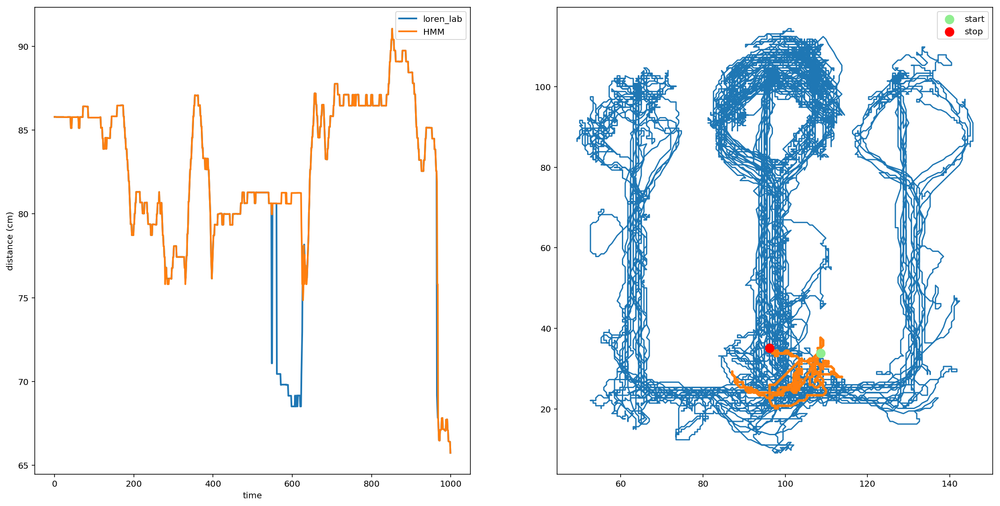

In [24]:
plot_linear_distance(linear_position_df, linear_distance, position, (14000, 15000))

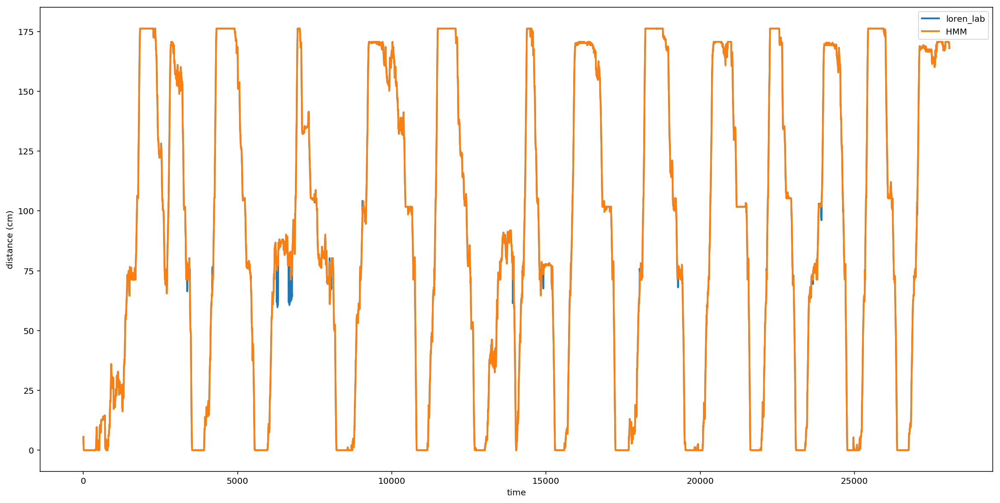

In [25]:
epoch_key = ('bon', 4, 4)
position_df = get_position_dataframe(epoch_key, ANIMALS)
linear_position_df = get_linear_position_structure(epoch_key, ANIMALS)

track_graph, center_well_id = make_track_graph(epoch_key, ANIMALS)
position = position_df.loc[:, ['x_position', 'y_position']].values
track_segment_id = classify_track_segments(track_graph, position,
                                           route_euclidean_distance_scaling=route_euclidean_distance_scaling)
linear_distance = calculate_linear_distance(track_graph, track_segment_id, center_well_id,
                                            position)

plt.figure(figsize=(20, 10))
plt.plot(linear_position_df.linear_distance.values, linewidth=2, label='loren_lab')
plt.plot(linear_distance, linewidth=2, label='HMM')
plt.xlabel('time')
plt.ylabel('distance (cm)')
plt.legend();